# AI Super-resolution Image Recipe for Ecommerce
The Jupyter notebook companion for Prolego's [AI Super-resolution Image Recipe for Ecommerce](http://prolego.io/#recipes).

## About [Prolego](http://prolego.io)
Prolego is the AI acceleration parter for Fortunte 1000 companies. We develop AI strategies, mdoels and deploy AI solutions in the enterprise.
#### Prolego [AI Recipes](http://proleg.io/#recipes)
"What can we do with AI?" is the most common question CEOs ask us. Prolego recipes are designed to  help you identify potential use cases for AI at your company. 

## References
This code made public for educational purposes. Please refer to original resources and useage rights before deploying this code in any commercial applications.
### Fast.ai lesson 10
General approach and code excepts from [lesson 10 of Jeremy Howard's fast.ai](http://course.fast.ai/lessons/lesson10.html). 

### Perceptual Losses for Real-Time Style Transfer and Super-Resolution
Original paper by Justin Johnson, Alexandre Alahi, Li Fei-Fei. [ArXiv:1603.08155](https://arxiv.org/abs/1603.08155).
### Stanford Cars Dataset
[16,185 images of cars](http://ai.stanford.edu/~jkrause/cars/car_dataset.html).

From:  3D Object Representations for Fine-Grained Categorization
       Jonathan Krause, Michael Stark, Jia Deng, Li Fei-Fei
       4th IEEE Workshop on 3D Representation and Recognition, at ICCV 2013 (3dRR-13). Sydney, Australia. Dec. 8, 2013.

## Libraries and utility functions

In [3]:
# libraries and utilities
%matplotlib inline
import importlib
import kevin; importlib.reload(kevin)
from kevin import *
import matplotlib.patches as patches
from PIL import JpegImagePlugin
from PIL import ImageDraw, ImageFont

Using TensorFlow backend.
/home/kevin/anaconda2/envs/ai/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


kevin loaded
kevin loaded


In [14]:
#created symbolic link to slowdisk, mount for slower HDD
#large data sets stored on HDD, others stored on NVME SSD
SLOW_DATA_HOME_DIR = data_path + "slowdata/"
slow_results = data_path + "slowdata/results"; slow_results

'/home/kevin/nbs/10lesson/data/slowdata/results'

In [4]:
#displays an image in the notebook at a given figure size
def show_me(img, figsize=(12,12), suptitle='', title='', rect=None):
    plt.figure(figsize=figsize)
    fig,ax = plt.subplots(1, figsize=figsize)
    if isinstance(img, JpegImagePlugin.JpegImageFile): ax.imshow(img)
    if isinstance(img, Image.Image): ax.imshow(img)
    elif isinstance(img, np.ndarray): ax.imshow(img.astype('uint8'))
    if suptitle != '': 
        plt.suptitle(suptitle, fontsize=32, color='#b58900')
    if title != '': 
        plt.title(title + '\n', fontsize=18, color='#93a1a1')
    if rect: ax.add_patch(rect)
    return plt.show()

In [15]:
def blur_box(image, box=(30, 30, 40, 40), n_blur=1):
    img=copy.deepcopy(image)
    ic = img.crop(box) 
    for i in range(n_blur):
        ic = ic.filter(ImageFilter.BLUR)
    img.paste(ic, box)
    return img

# Part 1 - Build models and train on imagenet data

In [16]:
model_from_paper = Image.open('/home/kevin/slowdisk/nbs/10lesson/perceptual_loss_model.png')

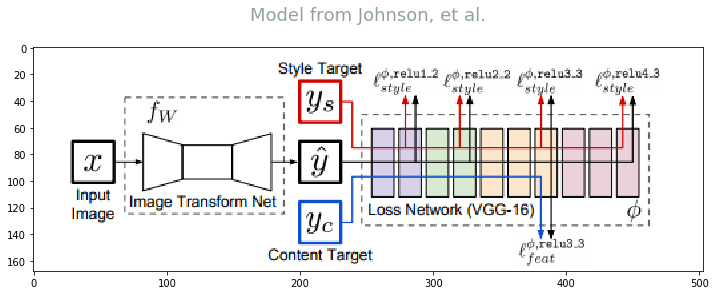

In [17]:
show_me(model_from_paper, title='Model from Johnson, et al.')

## Build Fw Model, Image Transform Net
This is the model we train

In [8]:
# prepross imagenet images for use in VGG
rn_mean=np.array([123.68, 116.779, 103.939], dtype = np.float32)
preproc = lambda x: (x - rn_mean)[:,:,:,::-1]
# [:, :, :, ::-1] reverses the '3' >> the RGB
keras_preproc = Lambda(preproc)

In [9]:
def conv_block(x, filters, size, stride, activation=True, border_mode='same'):
    x=Convolution2D(nb_filter=filters, nb_row=size, nb_col=size, 
                    subsample=stride, border_mode=border_mode)(x)
    x=BatchNormalization(mode=2)(x)
    return Activation('relu')(x) if activation else x

In [10]:
def res_block(x_in, filters=64, size=3, stride=(1,1)):
    x=conv_block(x_in, filters, size, stride)
    x=conv_block(x, filters, size, stride, activation=False)
    return merge([x, x_in], mode='sum')

In [11]:
def up_block(x, filters=64, size=3, stride=(1,1), border_mode='same'):
    x=keras.layers.convolutional.UpSampling2D()(x)
    x=Convolution2D(nb_filter=filters, nb_row=size, nb_col=size, 
                    subsample=stride, border_mode=border_mode)(x)
    return Activation('relu')(x)

In [12]:
def get_super_res_layers(arr):
    inp=Input(arr.shape[1:])
    x=conv_block(inp, filters=64, size=9, stride=(1,1))
    for i in range(4): x=res_block(x)
    x=up_block(x)
    x=up_block(x)
    x=conv_block(x, filters=3, size=9, stride=(1,1), activation=False)
    x = Activation('tanh')(x)
    outp = Lambda(lambda x: (x+1)*127.5)(x)
    return inp, outp

In [19]:
low_res_input, super_res_output = get_super_res_layers(arr_lr)

## Build loss network (VGG-16)
Used to calculate losses. This model isn't trained.

In [20]:
hr_input_shape = arr_hr.shape[1:]
vgg_hr_input = Input(hr_input_shape)
vgg_input_tensor = keras_preproc(vgg_hr_input)
vgg=VGG16(include_top=False, input_tensor=vgg_input_tensor)
for l in vgg.layers: l.trainable = False

In [21]:
def get_vgg_layer_output(model, layer_number):
    return model.get_layer(name=f'block{layer_number}_conv2').output

In [22]:
vgg_content_model_output_layers = [get_vgg_layer_output(vgg,ln) for ln in [1,2,3]]
vgg_content_model = Model(vgg_hr_input, vgg_content_model_output_layers)

In [23]:
print(vgg_hr_input.shape)
print(super_res_output.shape)
y_c = vgg_content_model(vgg_hr_input)
y_hat = vgg_content_model(super_res_output)

(?, 288, 288, 3)
(?, 288, 288, 3)


#### Loss function, Euclidean distance between the vgg output layers

In [24]:
# Used Jeremy Howard's loss function for Euclidean distance. I found this code to be a 
# confusing implementation of Equation (2) in Johnson, et al.
def mean_sqr_b(diff): 
    dims = list(range(1,K.ndim(diff)))
    return K.expand_dims(K.sqrt(K.mean(diff**2, dims)), 0)
w=[0.1, 0.8, 0.1]
def content_fn(x): 
    res = 0; n=len(w)
    for i in range(n): res += mean_sqr_b(x[i]-x[i+n]) * w[i]
    return res

In [25]:
super_res_model_input = [low_res_input, vgg_hr_input]
super_res_model_output = Lambda(content_fn)(y_c+y_hat)

In [26]:
super_res_model = Model(super_res_model_input, super_res_model_output)

In [27]:
super_res_model.compile('adam', 'mae')

## Train model

#### Load training data

Baseline training data. Downloaded entire imagenet dataset and resize to 288x288 and 72x72

In [18]:
#Imagenet
arr_lr = bcolz.open(IMAGENET_RESOURCES + 'imagenet_files_resized_72.bc')
arr_hr = bcolz.open(IMAGENET_RESOURCES + 'imagenet_files_resized_288.bc')

In [231]:
# approach outlined in fast.ai lesson 10
def train(bs=16, niter=10):
    targ = np.zeros((bs,1))
    bc = BcolzArrayIterator(arr_lr, arr_hr, batch_size=bs)
    for i in range(niter):
        lr, hr = next(bc)
        super_res_model.train_on_batch([lr[:bs], hr[:bs]], targ)

#### Before running on entire dataset let's see how fast it learns

In [232]:
im_lr = arr_lr[-215]
im_hr = arr_hr[-215]
# plt.imshow(im_hr.astype('uint8'))

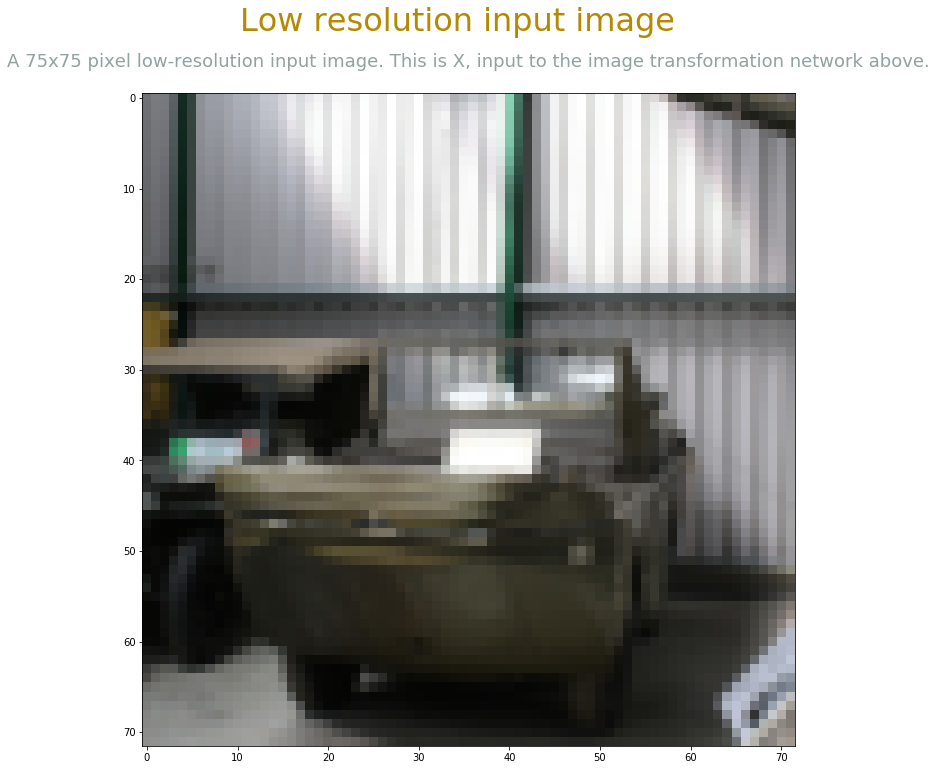

In [233]:
# low res 75x75 starting image
show_me(im_lr, figsize=(12,12), suptitle='Low resolution input image', title='A 75x75 pixel low-resolution input image. This is X, input to the image transformation network above.')

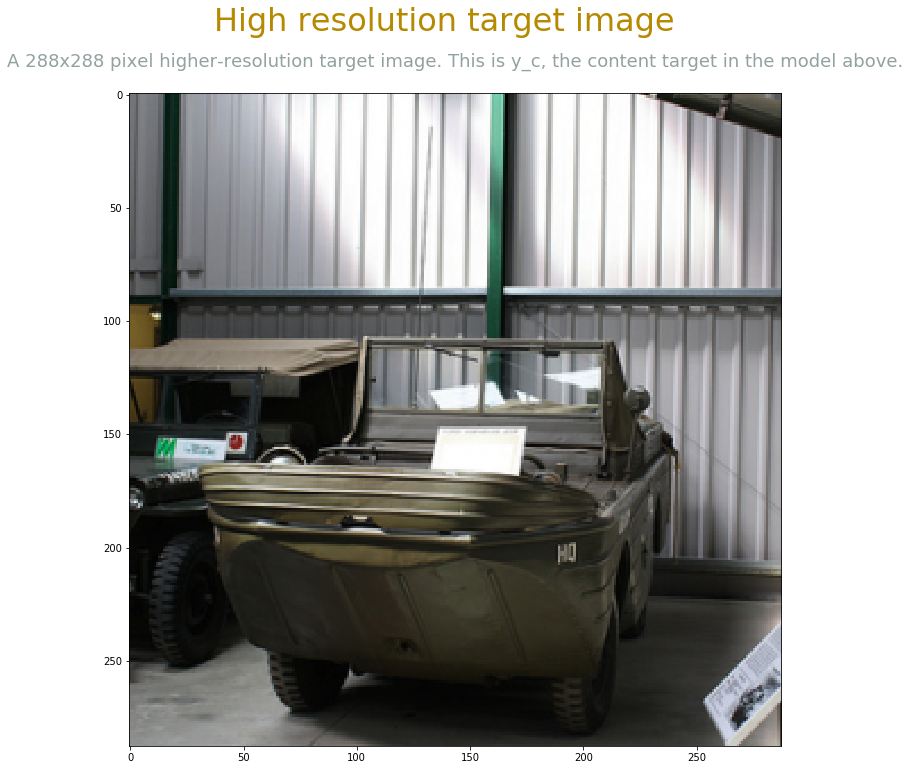

In [234]:
# train model to produce higher res model. Training target:
title=title='A 288x288 pixel higher-resolution target image. This is y_c, the content target in the model above.'
show_me(im_hr, figsize=(12,12), suptitle='High resolution target image', title=title)

In [235]:
# helper function to generate outputs
def gen_im_pred(low_res, high_res):
    gen_model = Model(low_res_input, super_res_output)
    generated_image = gen_model.predict(np.expand_dims(low_res,0))
    score = super_res_model.evaluate([np.expand_dims(low_res,0),np.expand_dims(high_res,0)],np.zeros((1,1))); score
    return generated_image[0], score

In [236]:
# 10 iterations, 160 images
train(bs=16, niter=10)
super_res_model.save_weights(slow_results+'super_res_160im.h5')

1/1 [==============================] - 0s
score: 487.72845459


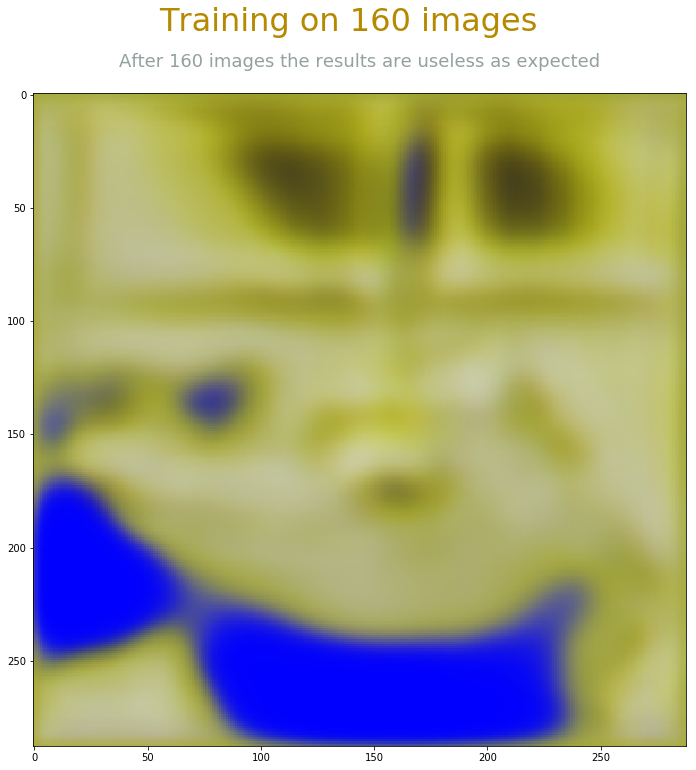

In [237]:
im_pred, score = gen_im_pred(im_lr, im_hr)
print("score:", score)
title=title='After 160 images the results are useless as expected'
show_me(im_pred, figsize=(12,12), suptitle='Training on 160 images', title=title)

1/1 [==============================] - 0s
score: 330.112640381


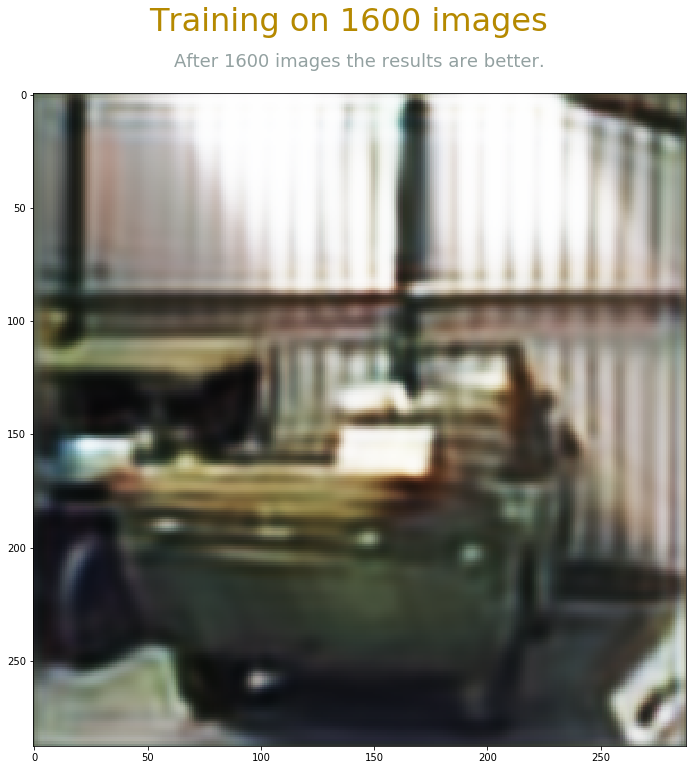

In [238]:
# 100 iterations, 1600 images
train(bs=16, niter=100)
super_res_model.save_weights(slow_results+'super_res_1600im.h5')
im_pred, score = gen_im_pred(im_lr, im_hr)
print("score:", score)
title=title='After 1600 images the results are better.'
show_me(im_pred, figsize=(12,12), suptitle='Training on 1600 images', title=title)

In [ ]:
# 1000 iterations, 16000 images
%time train(bs=16, niter=1000)
super_res_model.save_weights(slow_results+'super_res_16000im.h5')

1/1 [==============================] - 0s
score: 261.107452393


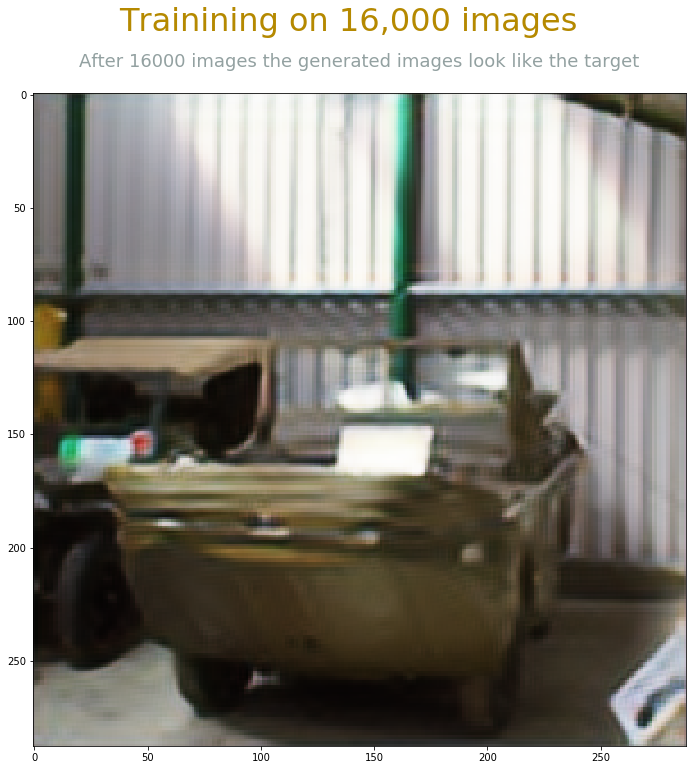

In [241]:
super_res_model.load_weights(slow_results+'super_res_16000im.h5')
im_pred, score = gen_im_pred(im_lr, im_hr)
print("score:", score)
title=title='After 16000 images the generated images look like the target'
show_me(im_pred, figsize=(12,12), suptitle='Trainining on 16,000 images', title=title)

After training on just 16,000 images we're getting some good results. Loss score has dropped down to 261 from 487.

## Training on 160,000 images

CPU times: user 37min 31s, sys: 22min 40s, total: 1h 11s
Wall time: 1h 20min 37s
1/1 [==============================] - 0s
score: 247.639205933
an array


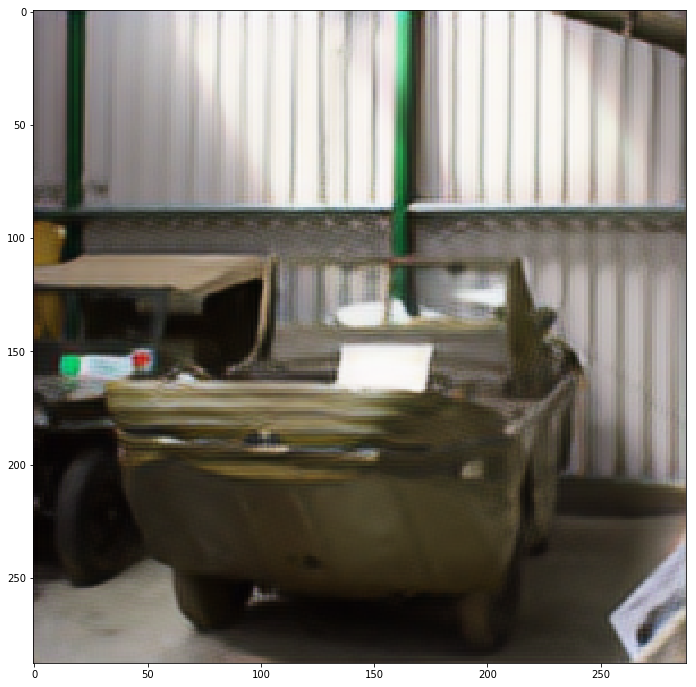

In [28]:
# 10,000 iterations, 160,000 images
%time train(bs=16, niter=10000)
im_pred, score = gen_im_pred(im_lr, im_hr)
print("score:", score)
show_me(im_pred)

After 160,000 images our results are starting to level off. Image resolution looks sharper and loss score has dropped to 247.

### Train on entire set then re-train with annealing, lower learning rate

In [29]:
max_iterations = len(arr_hr)//16; max_iterations

80072

In [ ]:
train(bs=16, niter=max_iterations)

In [ ]:
#lower learning rate
K.set_value(super_res_model.optimizer.lr, .0001)
train(bs=16, niter=10000)

In [391]:
weights_name = 'max_iter2.h5'
# super_res_model.save_weights(slow_results + weights_name)
super_res_model.load_weights(slow_results + weights_name)

1/1 [==============================] - 0s
score: 241.44833374


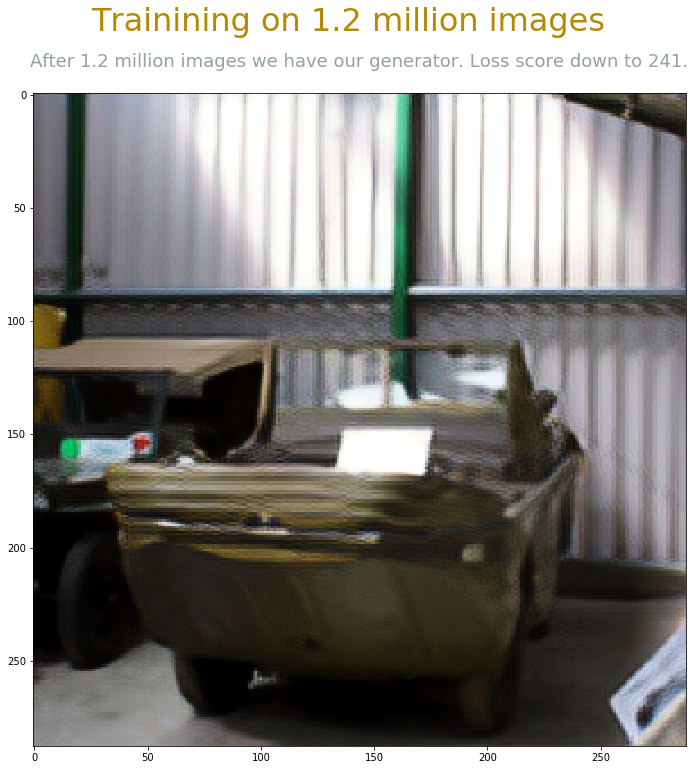

In [392]:
im_pred, score = gen_im_pred(im_lr, im_hr)
print("score:", score)
title=title='After 1.2 million images we have our generator. Loss score down to 241.'
show_me(im_pred, figsize=(12,12), suptitle='Trainining on 1.2 million images', title=title)

In [393]:
#create our basic super-resolution generating model.
gen_super_res = Model(low_res_input, super_res_output)
# gen_super_res.save(slow_results + 'gen_super_res.h5')
# gen_super_res = load_model(slow_results + 'gen_super_res.h5')

## Now build a model to generate 1152x1152 from 288x288

### WTF?? How is this even possible???

At first this approach seems like a fool's errand. We trained the model on an input image of 75x75 pixels. How can we use the same model with an input image of 288x288?

The model is entirely made of convolutional layers - no dense layers. So we just need to change the input shape and we can then re-use the same weights!

In [394]:
input_288, output_1152 = get_super_res_layers(arr_hr)
bigger_res_model= Model(input_288, output_1152)
bigger_res_model.set_weights(gen_super_res.get_weights())

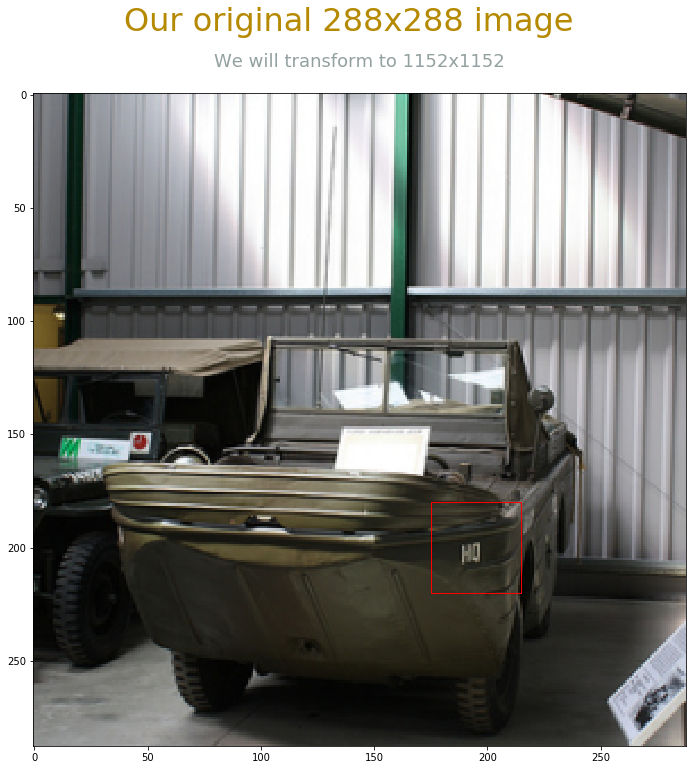

In [395]:
suptitle = 'Our original 288x288 image'
title=title='We will transform to 1152x1152'
rect = patches.Rectangle((175,180),40,40,linewidth=1,edgecolor='r',facecolor='none')
show_me(im_hr, title=title, suptitle=suptitle, rect=rect)

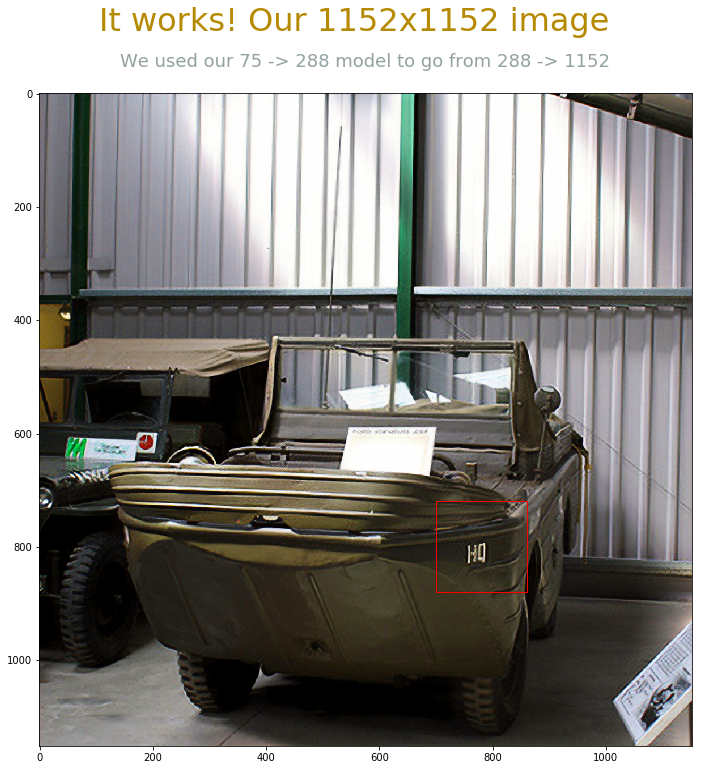

In [396]:
im_1152 = bigger_res_model.predict(np.expand_dims(im_hr,0))
suptitle = 'It works! Our 1152x1152 image'
title = 'We used our 75 -> 288 model to go from 288 -> 1152'
rect = patches.Rectangle((4*175,4*180),4*40,4*40,linewidth=1,edgecolor='r',facecolor='none')
show_me_rect(im_1152[0], suptitle=suptitle, title=title, rect=rect)

# Part 2 - finetune our models for car images

We'll now finetune the model by retraining on the Stanford car dataset

In [62]:
#train
CAR_FILES = '/home/kevin/slowdisk/cars/car_ims/'
car_arr_lr = bcolz.open(CAR_FILES + 'car_files_resized_72.bc')[:]
car_arr_hr = bcolz.open(CAR_FILES + 'car_files_resized_288.bc')[:]
car_training_files = CAR_FILES + 'train/'
#test
car_test_arr_lr = bcolz.open(CAR_FILES + 'test_car_files_resized_72.bc')[:]
car_test_arr_hr = bcolz.open(CAR_FILES + 'test_car_files_resized_288.bc')[:]
car_test_files = CAR_FILES + '/test/'
car_test_files_72 = CAR_FILES + 'test/resized_72/'
car_test_files_288 = CAR_FILES + 'test/resized_288/'
silver_car_72=Image.open(car_test_files_72 + '19.jpg')
silver_car_288=Image.open(car_test_files_288 + '19.jpg')

In [65]:
#helper function to turn an image into array of np images
def makearr(image):
    img = copy.deepcopy(image)
    return np.expand_dims(np.array(img),0)

## now finetune the model for just car images

### Create the model and load original model weights

In [59]:
blurry_low_res_input, blurry_super_res_output = get_super_res_layers(arr_lr)
blurry_y_hat = vgg_content_model(blurry_super_res_output)
    
blurry_super_res_model_input = [blurry_low_res_input, vgg_hr_input]
blurry_super_res_model_output = Lambda(content_fn)(y_c+blurry_y_hat)
    
blurry_res_model = Model(blurry_super_res_model_input, blurry_super_res_model_output)
blurry_res_model.compile('adam', 'mae')
    
weights_name = 'max_iter2.h5'
blurry_res_model.load_weights(slow_results + weights_name)

### train the car image model
Doesn't require bcolz since we don't have many images.

In [83]:
bs=len(car_arr_lr)
targ = np.zeros((bs,1))
K.set_value(blurry_res_model.optimizer.lr, .01)
blurry_res_model.fit([car_arr_lr[:bs], car_arr_hr[:bs]], targ, batch_size=8, nb_epoch=2, validation_split=0.05)

Train on 15280 samples, validate on 805 samples
Epoch 1/2
15280/15280 [==============================] - 461s - loss: 191.4898 - val_loss: 186.4559
Epoch 2/2
15280/15280 [==============================] - 461s - loss: 188.2655 - val_loss: 185.1741


In [84]:
K.set_value(blurry_res_model.optimizer.lr, .0001)

In [85]:
blurry_res_model.fit([car_arr_lr[:bs], car_arr_hr[:bs]], targ, batch_size=8, nb_epoch=2, validation_split=0.05)

Train on 15280 samples, validate on 805 samples
Epoch 1/2
15280/15280 [==============================] - 461s - loss: 181.9717 - val_loss: 181.0204
Epoch 2/2
15280/15280 [==============================] - 461s - loss: 181.1342 - val_loss: 180.5155


In [86]:
K.set_value(blurry_res_model.optimizer.lr, .0001)

In [87]:
blurry_res_model.fit([car_arr_lr[:bs], car_arr_hr[:bs]], targ, batch_size=8, nb_epoch=2, validation_split=0.05)

Train on 15280 samples, validate on 805 samples
Epoch 1/2
15280/15280 [==============================] - 461s - loss: 180.2749 - val_loss: 179.7568
Epoch 2/2
15280/15280 [==============================] - 461s - loss: 180.1478 - val_loss: 179.7072


In [60]:
weights_name = 'car_6_iter.h5'
# weights_name = 'car_30_40_blur_6_iter.h5'
# blurry_res_model.save_weights(slow_results + weights_name)
blurry_res_model.load_weights(slow_results + weights_name)

### create image generating models

In [63]:
blurry_gen_super_res = Model(blurry_low_res_input, blurry_super_res_output)
blurry_288_input, blurry_1152_output = get_super_res_layers(car_arr_hr)
blurry_288_to_1152 = Model(blurry_288_input, blurry_1152_output)
blurry_288_to_1152.set_weights(blurry_res_model.get_weights())

## Let's see how orginal and customized car models do

### compare against car test data, images not trained by either model

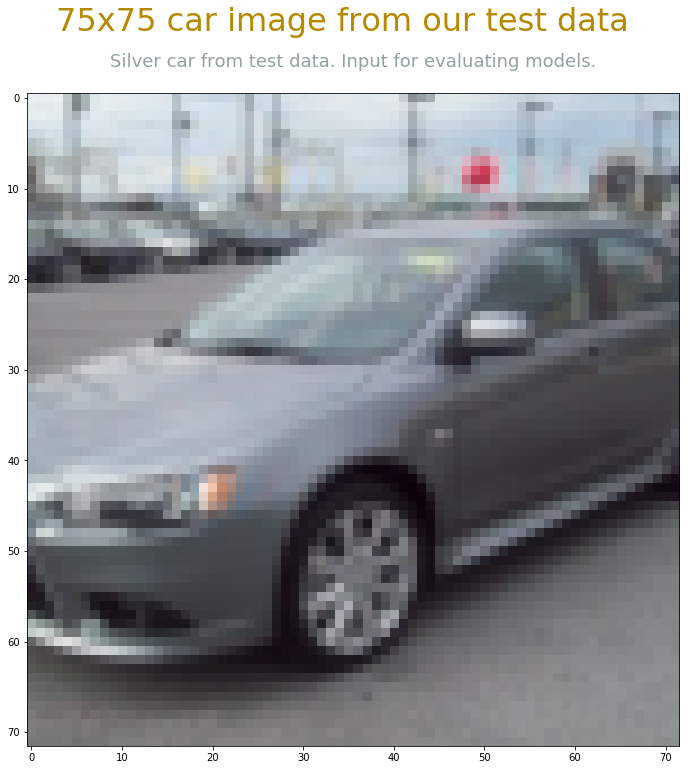

In [300]:
suptitle = '75x75 car image from our test data'
title = 'Silver car from test data. Input for evaluating models.'
show_me_rect(silver_car_72, suptitle=suptitle, title=title)

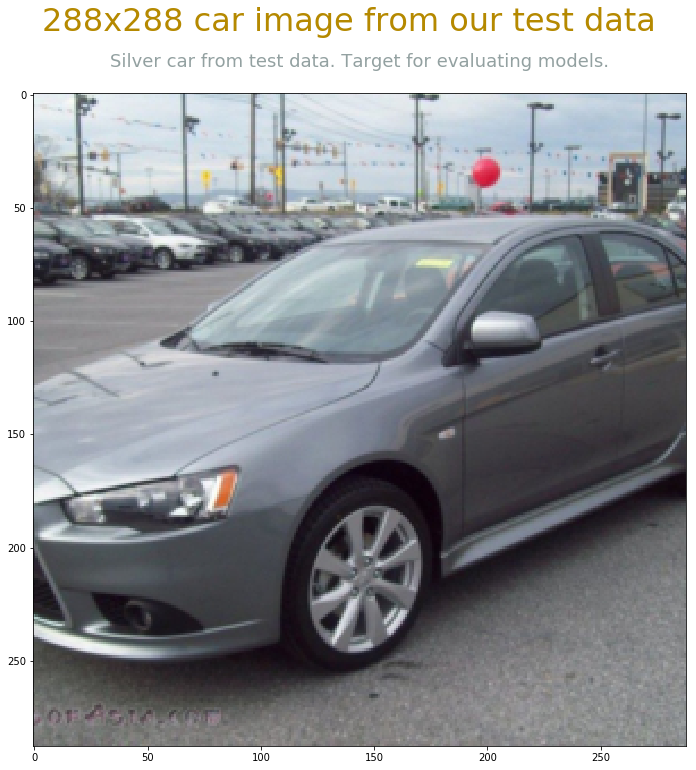

In [363]:
suptitle = '288x288 car image from our test data'
title = 'Silver car from test data. Target for evaluating models.'
show_me_rect(silver_car_288, suptitle=suptitle, title=title)

### Baseline - how well does our original model do?

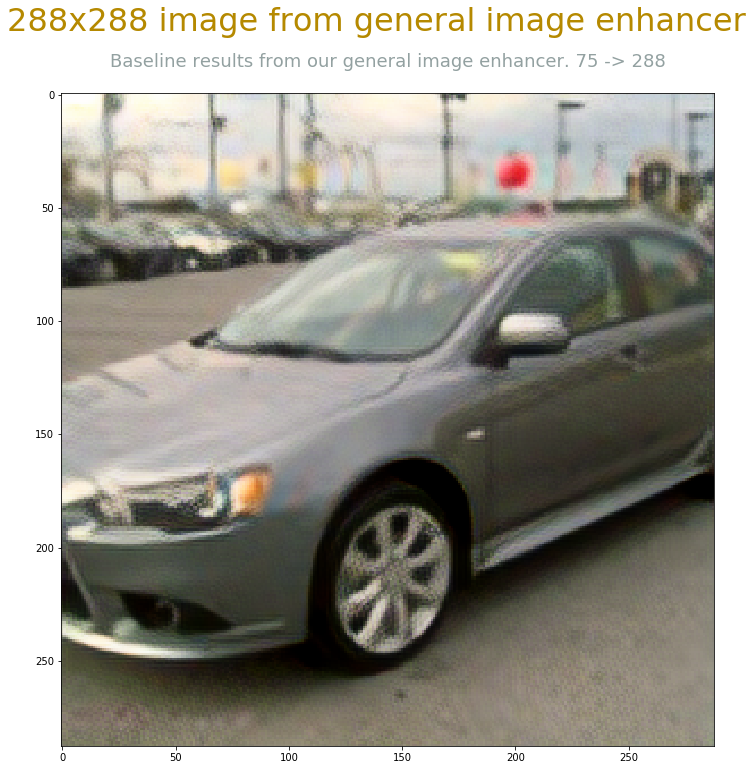

In [400]:
car_test_72_to_288_original_model = gen_super_res.predict(makearr(silver_car_72))
i=car_test_72_to_288_original_model[0]
suptitle = '288x288 image from general image enhancer'
title = 'Baseline results from our general image enhancer. 75 -> 288'
show_me_rect(i, suptitle=suptitle, title=title)

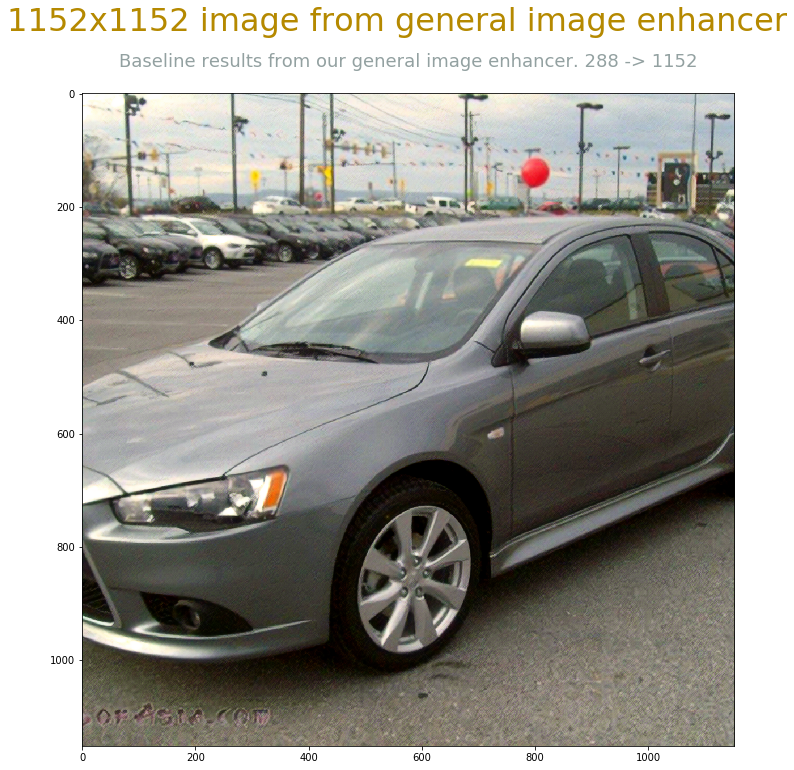

In [401]:
car_test_288_to_1152_original_model = bigger_res_model.predict(makearr(silver_car_288))
i=car_test_288_to_1152_original_model[0]
suptitle = '1152x1152 image from general image enhancer'
title = 'Baseline results from our general image enhancer. 288 -> 1152'
show_me_rect(i, suptitle=suptitle, title=title)

### New model fine-tuned on car images

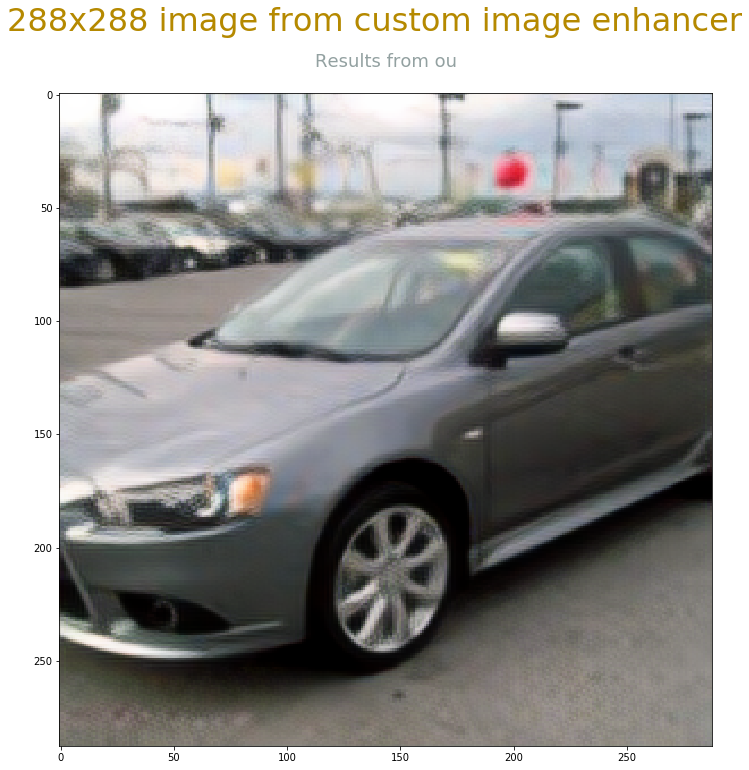

In [402]:
car_test_72_to_288_new_model = blurry_gen_super_res.predict(makearr(silver_car_72))
i=car_test_72_to_288_new_model[0]
suptitle = '288x288 image from custom image enhancer'
title = 'Results from ou'
show_me_rect(i, suptitle=suptitle, title=title)

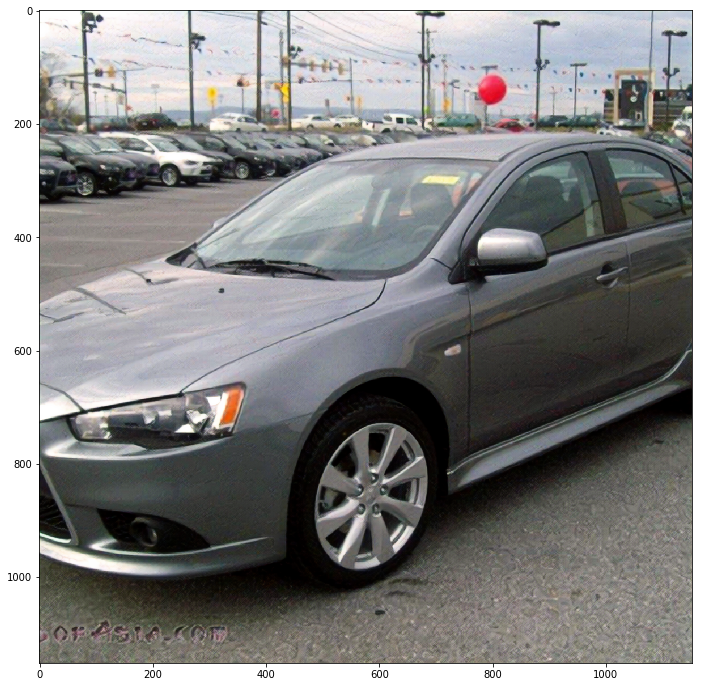

In [66]:
car_test_288_to_1152_new_model = blurry_288_to_1152.predict(makearr(silver_car_288))
show_me(car_test_288_to_1152_new_model[0])

### Side by side comparison

In [325]:
w,h=im1.size;h

1152

In [7]:
#yuck, refactor

def side_by_side(a1,a2, la1=None, la2=None):
    im1=Image.fromarray(a1[0].astype('uint8'))
    im2=Image.fromarray(a2[0].astype('uint8'))
    
    font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSerifCondensed-Bold.ttf", 35)
    if la1:
        draw = ImageDraw.Draw(im1)
        draw.text((10, 10),la1, fill='black', font=font)
        draw = ImageDraw.Draw(im1)

    if la2:
        draw = ImageDraw.Draw(im2)
        draw.text((10, 10),la2, fill='black', font=font)
        draw = ImageDraw.Draw(im2)

    w,h=im1.size
    images=[im1.crop((0,0,w/2,h)),im2.crop((0,0,w/2,h))]

    widths, heights = zip(*(i.size for i in images))

    total_width = sum(widths)
    max_height = max(heights)

    new_im = Image.new('RGB', (total_width, max_height))

    x_offset = 0
    for im in images:
      new_im.paste(im, (x_offset,0))
      x_offset += im.size[0]
    return new_im


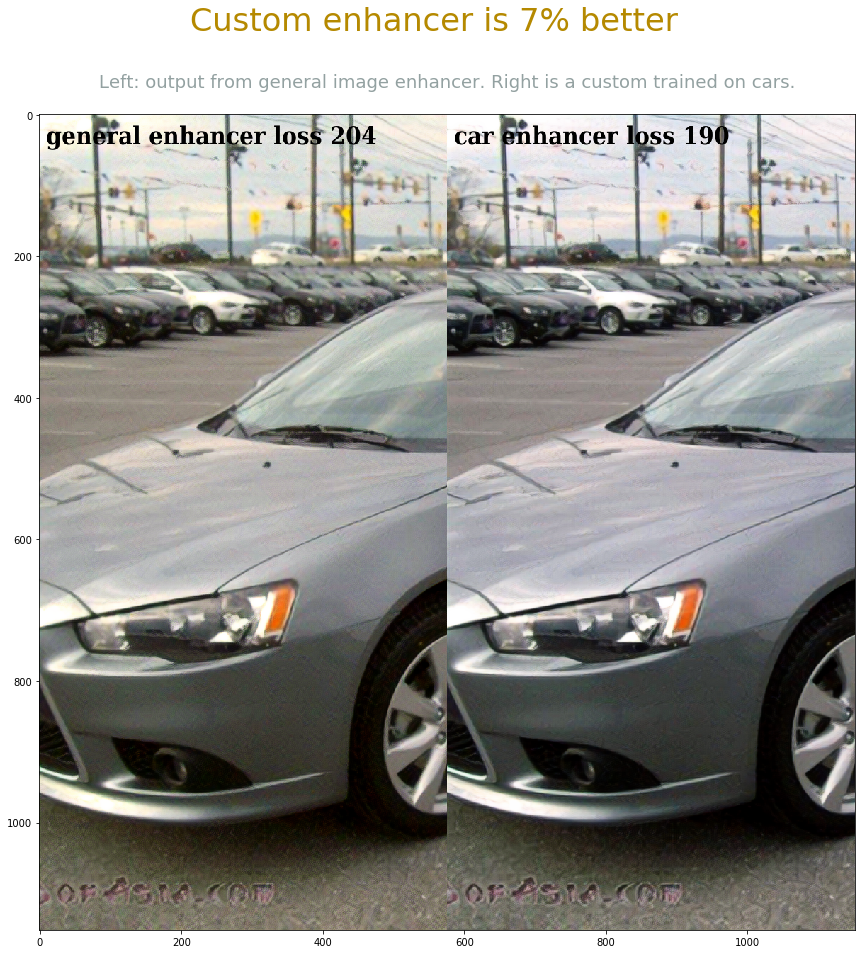

In [410]:
i=side_by_side(car_test_288_to_1152_original_model, car_test_288_to_1152_new_model, "general enhancer loss 204", "car enhancer loss 190")
suptitle = 'Custom enhancer is 7% better'
title = 'Left: output from general image enhancer. Right is a custom trained on cars.'
show_me_rect(i, suptitle=suptitle, title=title, figsize=(15,15))

### Quantify by scoring differences

In [406]:
# original model
original = super_res_model.evaluate([makearr(silver_car_72),makearr(silver_car_288)],np.zeros((1,1))); original

1/1 [==============================] - 0s


204.52598571777344

In [407]:
new = blurry_res_model.evaluate([makearr(silver_car_72),makearr(silver_car_288)],np.zeros((1,1))); new

1/1 [==============================] - 0s


190.729248046875

In [408]:
original/new
# More than 7% improvement by simple fine-tuning.

1.0723367695944968

## Try training on the blurred images

In [411]:
#add blurring to the 72x72 files and resave to a new directory. helper functinon:
def blur_box(image, box=(30, 30, 40, 40), n_blur=1):
    img=copy.deepcopy(image)
    ic = img.crop(box) 
    for i in range(n_blur):
        ic = ic.filter(ImageFilter.BLUR)
    img.paste(ic, box)
    return img

In [107]:
blurred_directory = car_training_files + 'blur_resized_72/'
blurred_car_file_names = sorted(list(glob.iglob(blurred_directory + '*.jpg')))
blur_arr=np.array([np.array(Image.open(fname)) for fname in blurred_car_file_names])

In [119]:
directory_288 = car_training_files + 'resized_288/'
car_file_names_288 = sorted(list(glob.iglob(directory_288 + '*.jpg')))
arr_288=np.array([np.array(Image.open(fname)) for fname in car_file_names_288])

In [121]:
weights_name = 'car_6_iter.h5'
blurry_res_model.load_weights(slow_results + weights_name)
bs=len(car_arr_hr)
targ = np.zeros((bs,1))
K.set_value(blurry_res_model.optimizer.lr, .001)
blurry_res_model.fit([blur_arr[:bs], arr_288[:bs]], targ, batch_size=8, nb_epoch=1, validation_split=0.05)

Train on 15280 samples, validate on 805 samples
Epoch 1/1
15280/15280 [==============================] - 467s - loss: 245.3609 - val_loss: 243.7707


In [67]:
weights_name = 'car_6_iter_1_iter_blur.h5'
# blurry_res_model.save_weights(slow_results + weights_name)
blurry_res_model.load_weights(slow_results + weights_name)

In [68]:
blurry_gen_super_res = Model(blurry_low_res_input, blurry_super_res_output)
blurry_288_input, blurry_1152_output = get_super_res_layers(car_arr_hr)
blurry_288_to_1152 = Model(blurry_288_input, blurry_1152_output)
blurry_288_to_1152.set_weights(blurry_res_model.get_weights())

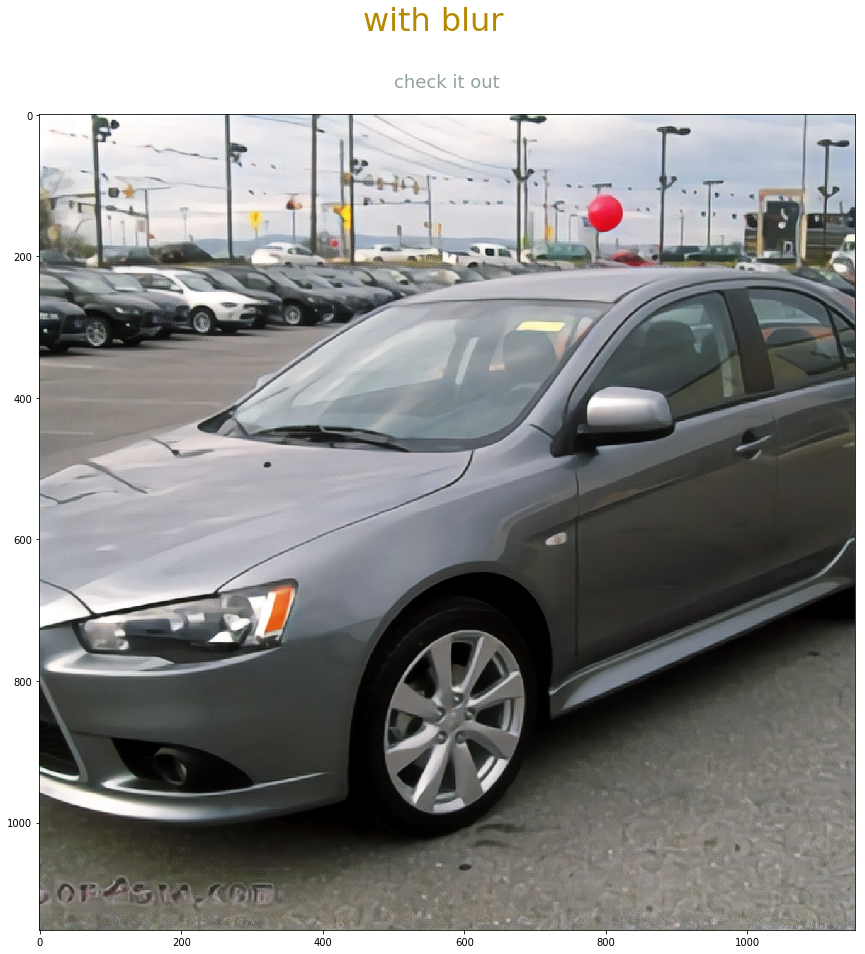

In [70]:
b_car_test_288_to_1152_new_model = blurry_288_to_1152.predict(makearr(silver_car_288))
show_me(b_car_test_288_to_1152_new_model[0], figsize=(15,15), suptitle='with blur', title='check it out')

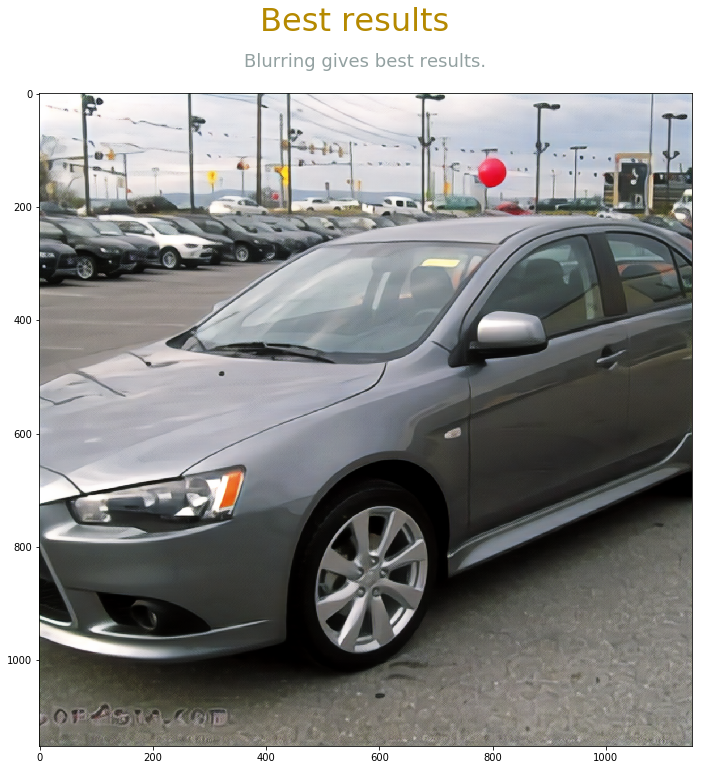

In [74]:
show_me(b_car_test_288_to_1152_new_model[0], suptitle='Best results', title='Blurring gives best results.')

In [415]:
#yuck, refactor to a general version taking an array of images and labels

def three_by_side(a1,a2,a3, la1=None, la2=None, la3=None):
    im1=Image.fromarray(a1[0].astype('uint8'))
    im2=Image.fromarray(a2[0].astype('uint8'))
    im3=Image.fromarray(a3[0].astype('uint8'))
    
    font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSerifCondensed-Bold.ttf", 25)
    if la1:
        draw = ImageDraw.Draw(im1)
        draw.text((10, 10),la1, fill='black', font=font)
        draw = ImageDraw.Draw(im1)

    if la2:
        draw = ImageDraw.Draw(im2)
        draw.text((10, 10),la2, fill='black', font=font)
        draw = ImageDraw.Draw(im2)

    if la3:
        draw = ImageDraw.Draw(im3)
        draw.text((10, 10),la3, fill='black', font=font)
        draw = ImageDraw.Draw(im3)


    w,h=im1.size
    images=[im1.crop((0,0,w/3,h)),im2.crop((0,0,w/3,h)),im3.crop((0,0,w/3,h))]

    widths, heights = zip(*(i.size for i in images))

    total_width = sum(widths)
    max_height = max(heights)

    new_im = Image.new('RGB', (total_width, max_height))

    x_offset = 0
    for im in images:
      new_im.paste(im, (x_offset,0))
      x_offset += im.size[0]
    return new_im


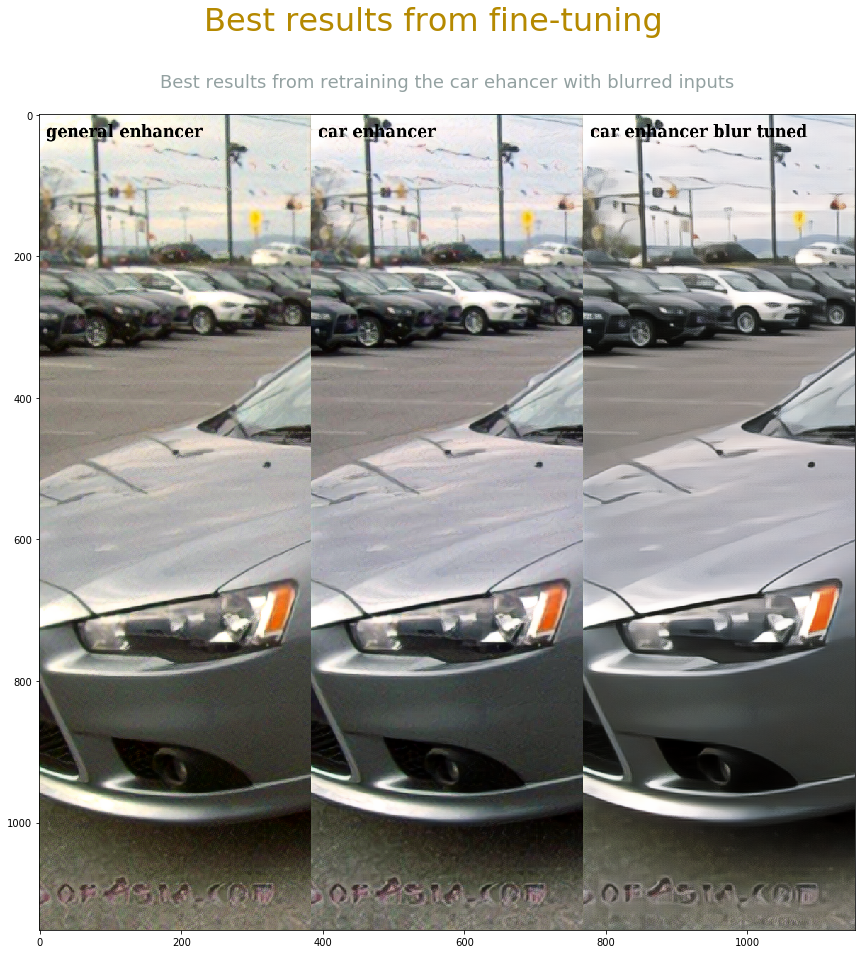

In [418]:
i=three_by_side(car_test_288_to_1152_original_model, car_test_288_to_1152_new_model,b_car_test_288_to_1152_new_model, "general enhancer", "car enhancer", "car enhancer blur tuned")
suptitle = 'Best results from fine-tuning'
title = 'Best results from retraining the car ehancer with blurred inputs'
show_me_rect(i, suptitle=suptitle, title=title, figsize=(15,15))

In [ ]:
i=side_by_side(car_test_288_to_1152_new_model, "general image enhancer", "car image enhancer")
suptitle = 'Custom image enhancer wins'
title = 'Left: output from general image enhancer. Right is a custom one trained on cars.'
show_me_rect(i, suptitle=suptitle, title=title, figsize=(15,15))

### Can the new model remove blurring?

In [183]:
blurred_silver_car_72 = blur_box(silver_car_72)

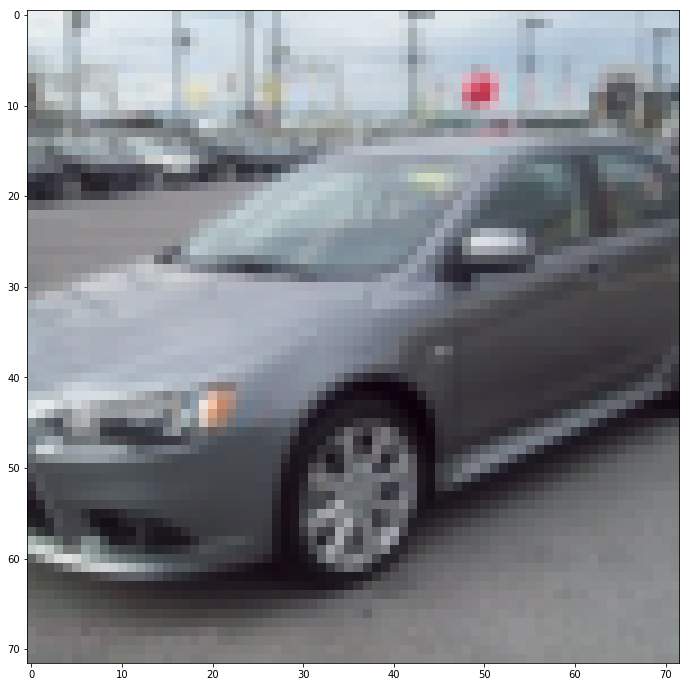

In [184]:
show_me(blurred_silver_car_72)

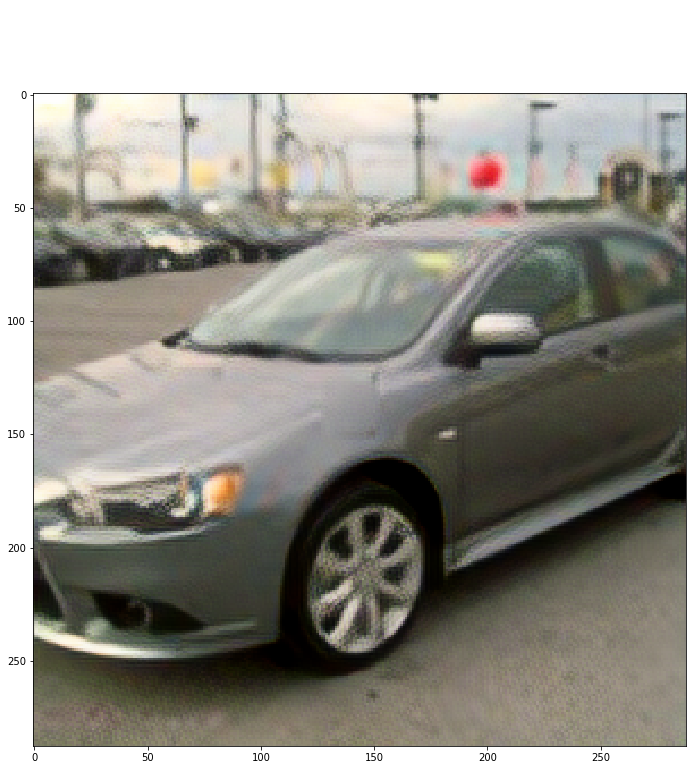

In [185]:
#original model
o_blur_car_test_72_to_288 = gen_super_res.predict(makearr(blurred_silver_car_72))
show_me(o_blur_car_test_72_to_288[0], suptitle='Original model with blurring', title='check it out')

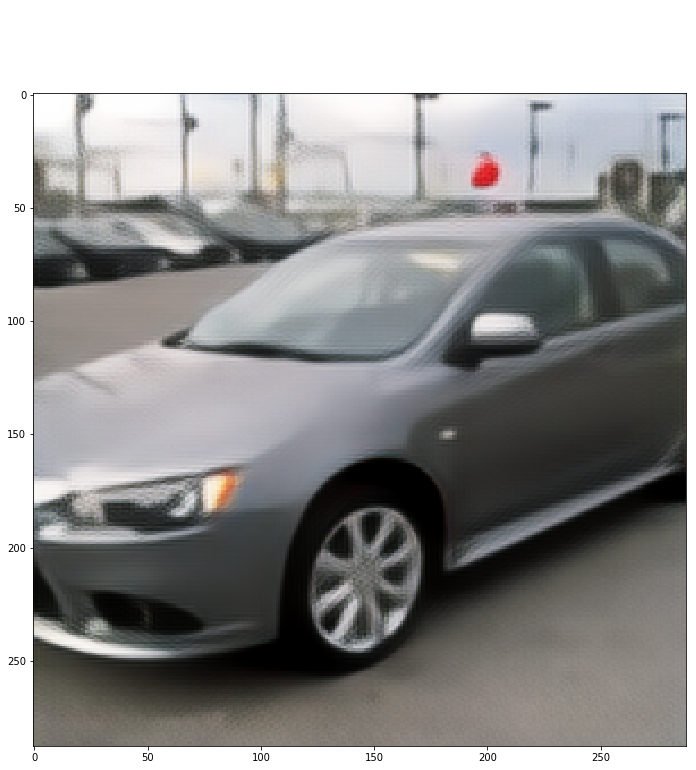

In [186]:

blur_car_test_72_to_288 = blurry_gen_super_res.predict(makearr(blurred_silver_car_72))
show_me(blur_car_test_72_to_288[0], suptitle='New model with blurring', title='check it out')

# Part 3 test on cars for sale

In [6]:
jc_car_files = ['/home/kevin/slowdisk/cars/jclewis/1.jpg',
 '/home/kevin/slowdisk/cars/jclewis/3.jpg',
 '/home/kevin/slowdisk/cars/jclewis/4.jpg',
 '/home/kevin/slowdisk/cars/jclewis/2.jpg']
jc_arr = np.array([np.array(Image.open(file)) for file in jc_car_files])
jc_car_dir = '/home/kevin/slowdisk/cars/jclewis/'

## Build a custom 480x480 to 1920x1920 super-resolution generator

In [30]:
input_480, output_1920 = get_super_res_layers(jc_arr)
res_480_to_1920 = Model(input_480, output_1920)
res_480_to_1920.set_weights(blurry_res_model.get_weights())

In [31]:
jc_1920 = [res_480_to_1920.predict(np.expand_dims(i,0)) for i in jc_arr ] 

In [165]:
for i in range(len(jc_1920)):
    im=Image.fromarray(jc_1920[i][0].astype('uint8'))
    im.save(jc_car_dir + str(i+1) + '_1920.jpg', quality=100)

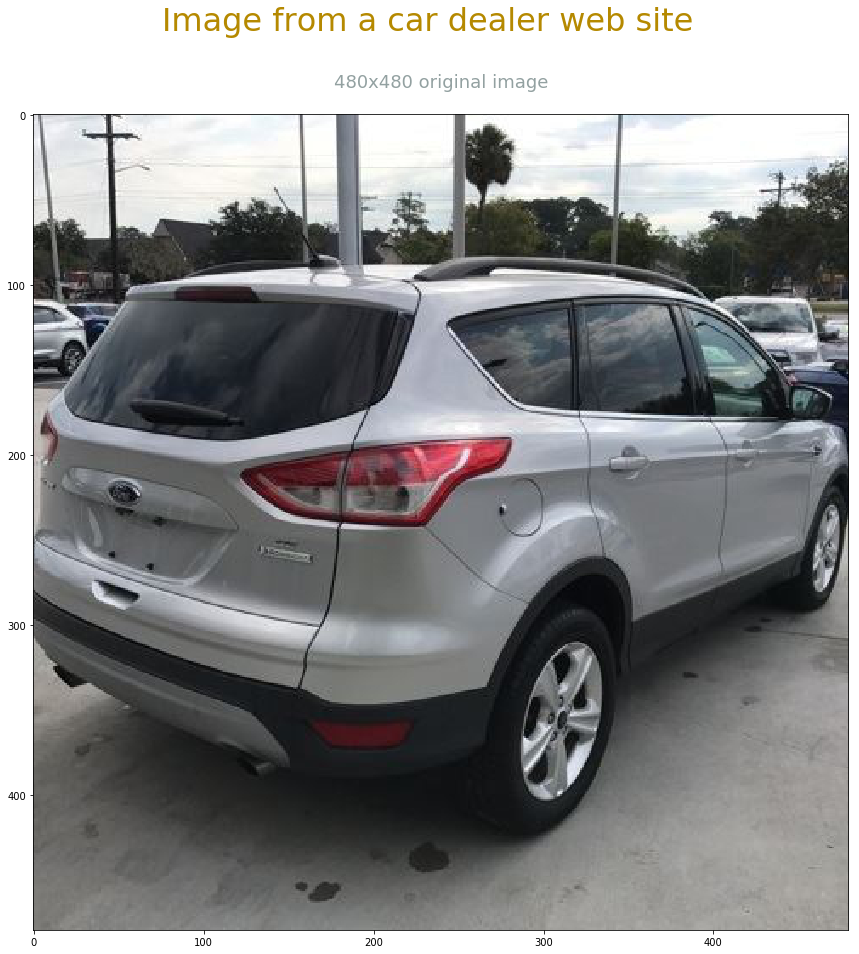

In [34]:
suptitle = 'Image from a car dealer web site'
title='480x480 original image'
i=jc_arr[1]
show_me(i, suptitle=suptitle, title=title, figsize=(15,15))

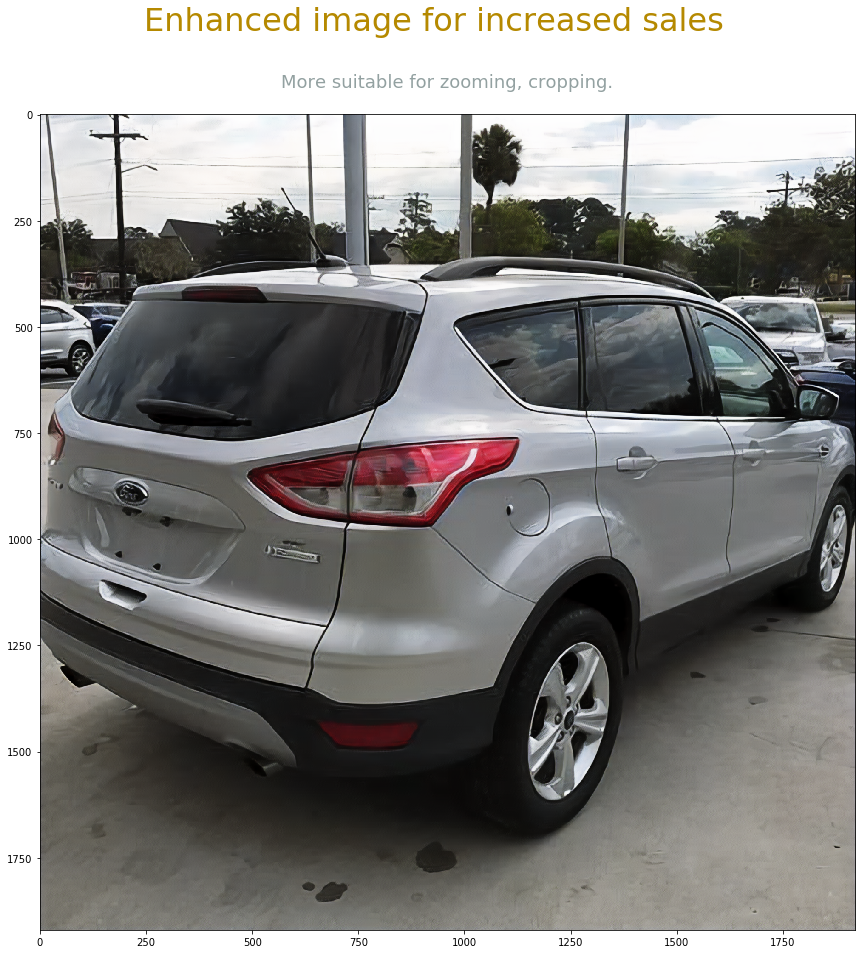

In [35]:
i=jc_1920[1][0]
suptitle = 'Enhanced image for increased sales'
title='More suitable for zooming, cropping.'
show_me(i, suptitle=suptitle, title=title, figsize=(15,15))

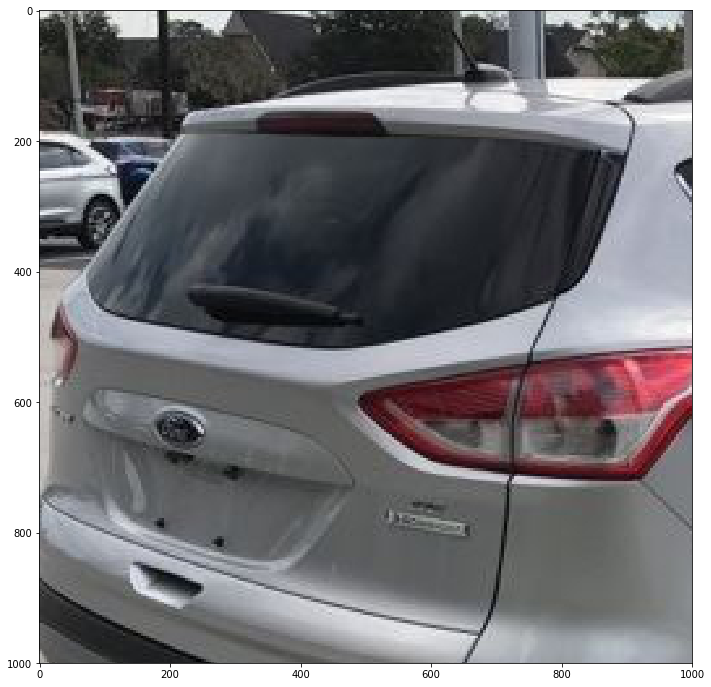

In [52]:
jc_480_as_1920 = Image.fromarray(jc_arr[1].astype('uint8'))
jc_480_as_1920=np.array(jc_480_as_1920.resize((1920,1920)).crop((0,250,1000,1250)))
jc_480_as_1920=np.expand_dims(jc_480_as_1920,0)
show_me(jc_480_as_1920[0])

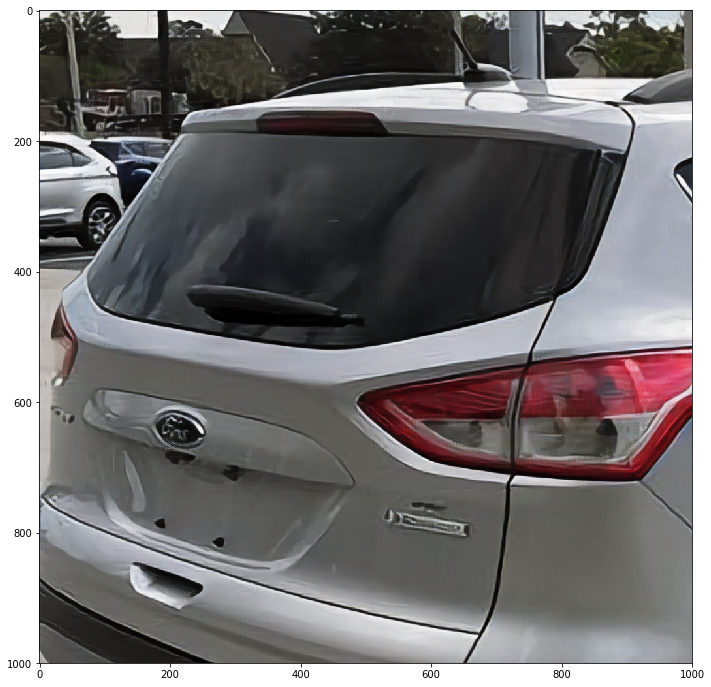

In [53]:
jc_arr_1920_crop = Image.fromarray(jc_1920[1][0].astype('uint8'))
jc_arr_1920_crop=np.array(jc_arr_1920_crop.resize((1920,1920)).crop((0,250,1000,1250)))
jc_arr_1920_crop=np.expand_dims(jc_arr_1920_crop,0)
show_me(jc_arr_1920_crop[0])

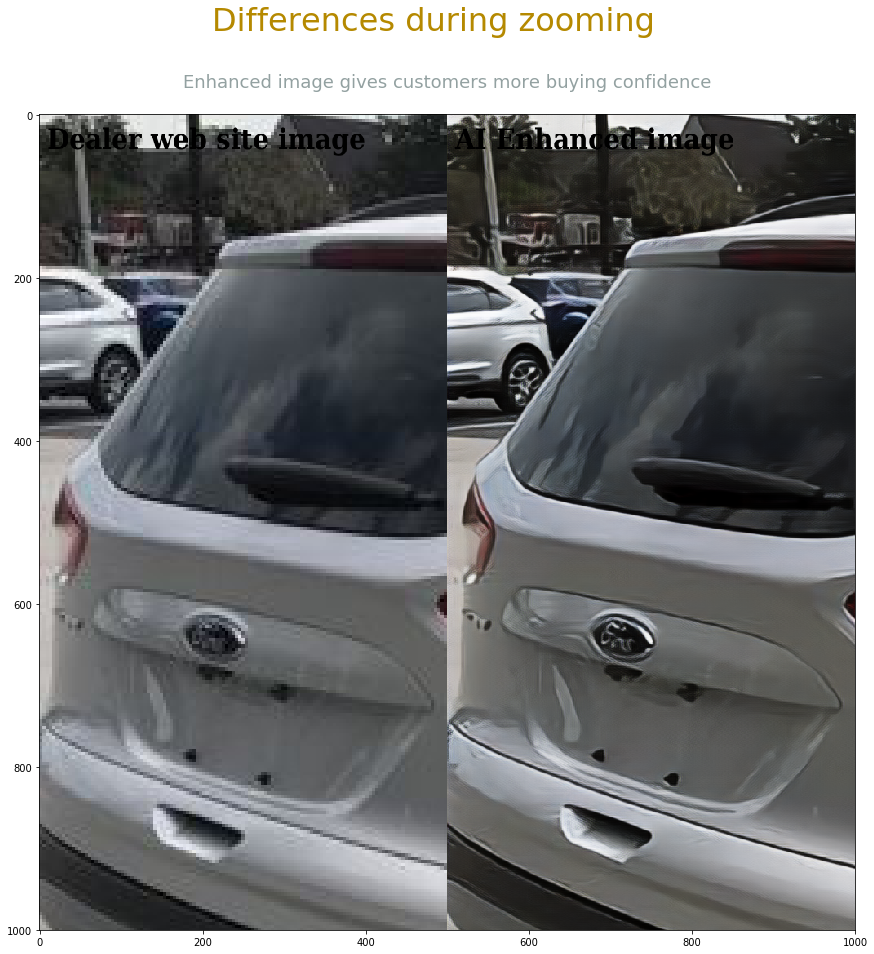

In [57]:
i=side_by_side(jc_480_as_1920,jc_arr_1920_crop, "Dealer web site image", "AI Enhanced image")
suptitle = 'Differences during zooming'
title='Enhanced image gives customers more buying confidence'
show_me(i, suptitle=suptitle, title=title, figsize=(15,15))

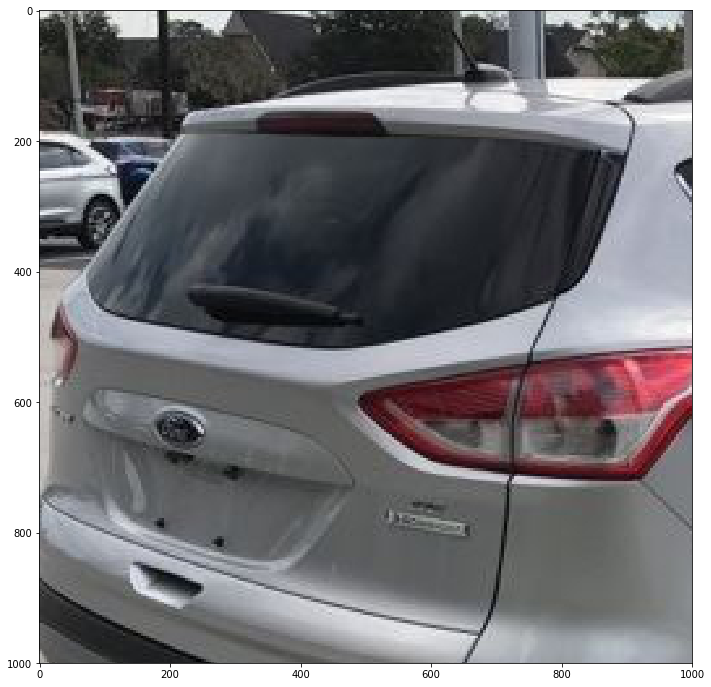

In [51]:
show_me(jc_480_as_1920[0])

In [40]:
side_by_side(jc_480_as_1920,jc_1920[1])

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


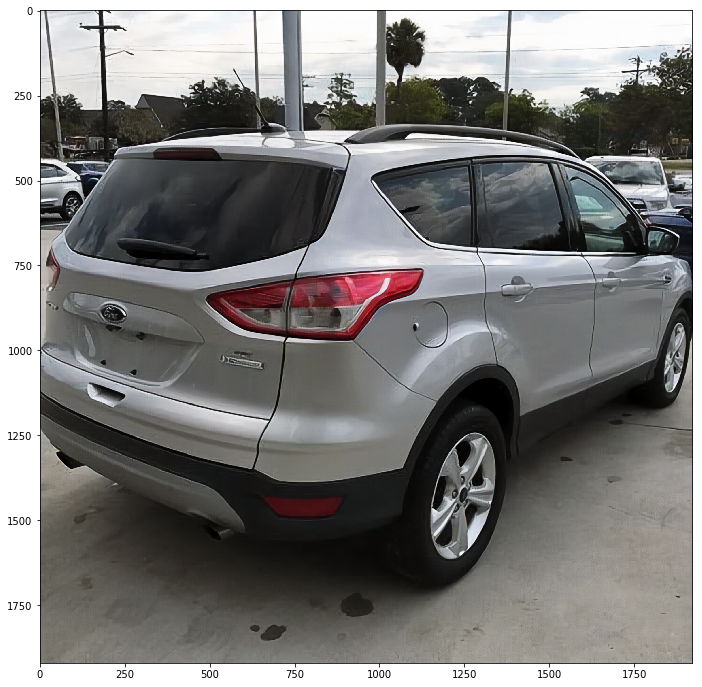

In [453]:
show_me(jc_1920[1][0])